# Figure 3: Assessing the Stability of Meta-analyses through Repeated Subsampling
## Subsamples were rather arbitrarily set to (N = 50, N =  0.2 * Ndomain). Using fixed N favors smaller (sub)BDs but shows the effect of absolute Ns, whereas fixed proportion should facilitate comparison across BDs.
## We also using a sliding proportion approach to see how stability increases as effect of proportion within a (sub)BD.


#### Author: Neville Magielse
#### Date: 02.08.2024

In [1]:
# Imports
import nimare
import os
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import nilearn.plotting, nilearn.maskers
import nibabel
import sys
import SUITPy
import SUITPy.flatmap as flatmap
from nimare.meta.cbma.ale import ALE
from nimare.correct import FWECorrector
from tqdm import tqdm

# Font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192


# User-specified base working directory
BASE_DIR = '/data/project/cerebellum_ale/'  # Change this to your project folder. Make sure they have input and output folders.

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

# Order BDs by their sample size for plotting.

In [2]:
BDs = ['Action', 'Cognition', 'Emotion', 'Interoception',  'Perception']

In [3]:
# Add the number of experiments:
BDs_exps = {
    'Action': 583,
    'Cognition': 1522,
    'Emotion': 420,
    'Interoception': 124,
    'Perception': 652
}

In [4]:
BDs_order = pd.Series(BDs_exps).sort_values().index

In [5]:
# For the 0.2-proportional subsampling, add the number of experiments from the total (for plotting).
BDs_exps_sample = {
    'Action': 117,
    'Cognition': 304,
    'Emotion': 84,
    'Interoception': 25,
    'Perception': 130
}

# First, 50 experiments per subsample.
## For each step, we will just get the necessary data. The plotting of the figures in this notebook should thus be modular. :) 

In [6]:
# Open dictionaries, we will keep overwriting these throughout this notebook.
zmaps = {}
surf_zmaps = {}
corrs = {}
corrs_tril = {}

In [7]:
# Import data for each BD
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz') # For boxplot visualisation, highlighting correlation between full, unthresholded z-maps is most revealing.
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space set to 'SPM' to match the BrainMap database.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.70it/s]


In [8]:
corrs[analysis] = {}
corrs_tril[analysis] = {}
for bd in BDs:
    corrs[analysis][bd] = np.corrcoef(surf_zmaps[analysis][bd])
    corrs_tril[analysis][bd] = corrs[analysis][bd][np.tril_indices(50, -1)]

In [9]:
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['BD', 'pair', 'corr']

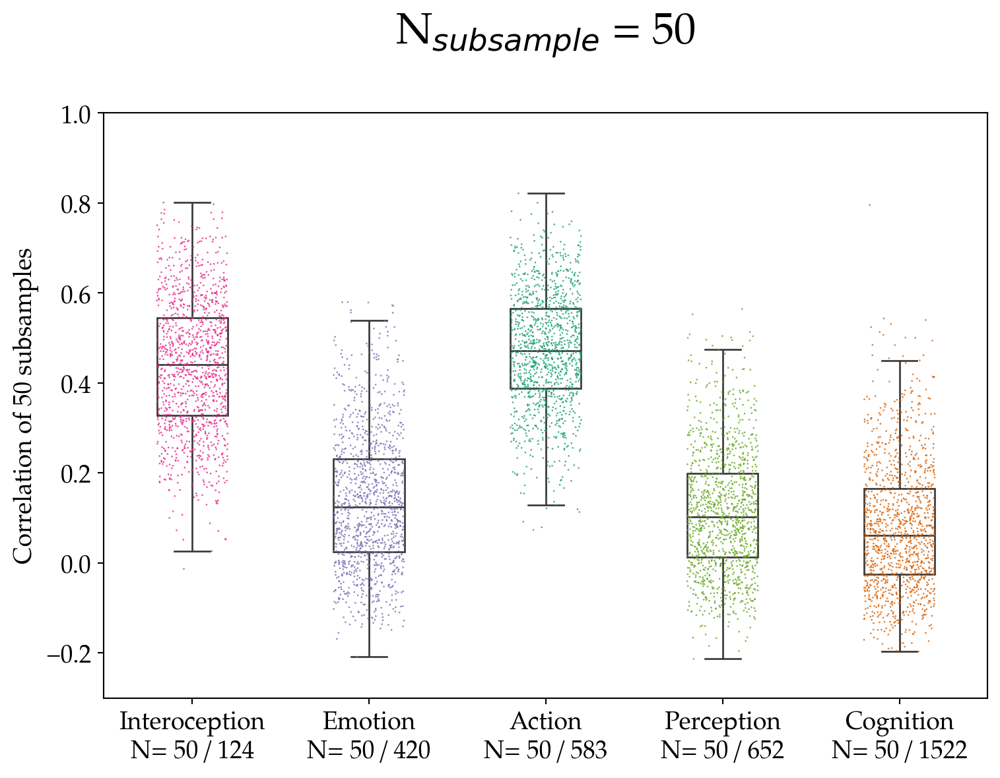

In [10]:
# Boxplots for within-BD spatial correlations of subsamples (N = 50).

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Make the background transparent
fig.patch.set_facecolor('none')

# Make the background of plotting area transparent
ax.patch.set_facecolor('none')

# Use the first 5 colors from the Dark2 colormap
colors = sns.color_palette("Dark2", n_colors=5)

sns.stripplot(data=corrs_long, x='BD', y='corr', 
              order=BDs_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='BD', palette=colors, legend=False) # Chose quite a high alpha to have poppy colors.
sns.boxplot(data=corrs_long, x='BD', y='corr',
            order=BDs_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='BD', palette=colors, legend=False)
ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 50', y=1.1, fontsize=25)

# Create x-axis labels for BDs with sample size information.
ax.set_xticks(range(len(BDs_order)))
ax.set_xticklabels([f'{BD}\nN= 50 / {BDs_exps[BD]}' for BD in BDs_order], rotation=0, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()


In [11]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_SpatialCorrelations_N50.png'), bbox_inches='tight')

# Then, the 0.2-proportion subsampling for the BDs.

In [12]:
# Import data
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-02')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to match BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 12.26it/s]


In [13]:
corrs[analysis] = {}
corrs_tril[analysis] = {}
for bd in BDs:
    corrs[analysis][bd] = np.corrcoef(surf_zmaps[analysis][bd])
    corrs_tril[analysis][bd] = corrs[analysis][bd][np.tril_indices(50, -1)]

In [14]:
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['BD', 'pair', 'corr']

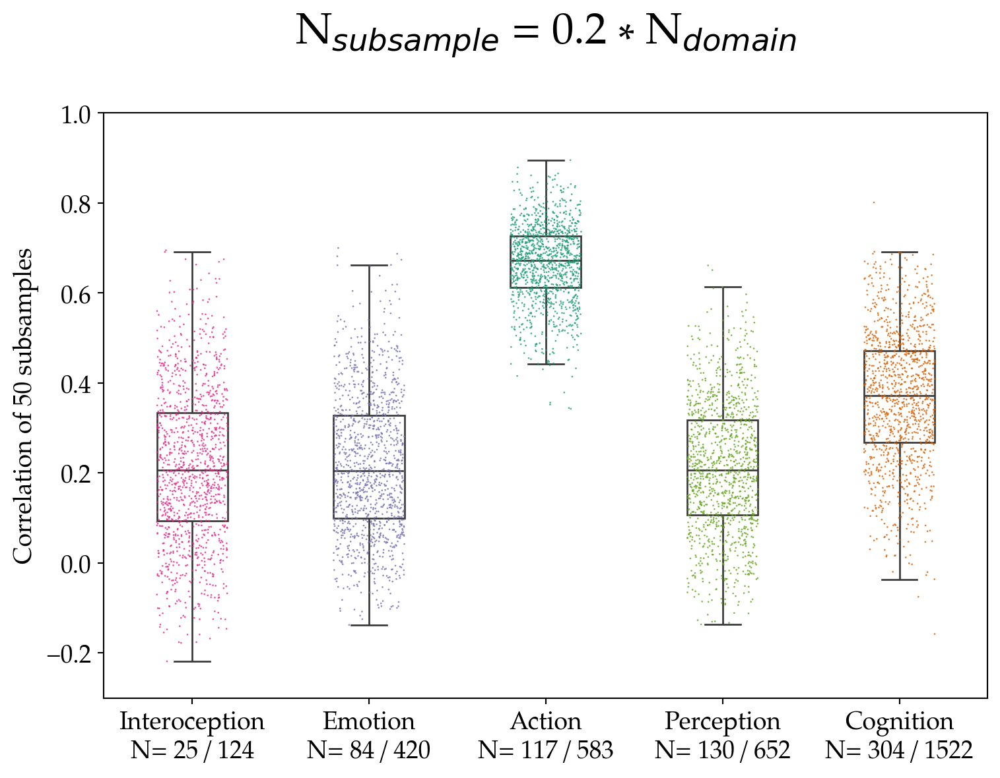

In [15]:
# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Make the background transparent
fig.patch.set_facecolor('none')

# Make the background of plotting area transparent
ax.patch.set_facecolor('none')

# Use the first 5 colors from the Dark2 colormap
colors = sns.color_palette("Dark2", n_colors=5)

sns.stripplot(data=corrs_long, x='BD', y='corr', 
              order=BDs_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='BD', palette=colors, legend=False)
sns.boxplot(data=corrs_long, x='BD', y='corr',
            order=BDs_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='BD', palette=colors, legend=False)
ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 0.2 * N$_{domain}$', y=1.1, fontsize=25)

# Add x-axis labels with subsample size information.
ax.set_xticks(range(len(BDs_order)))
ax.set_xticklabels([f'{BD}\nN= {BDs_exps_sample[BD]} / {BDs_exps[BD]}' for BD in BDs_order], rotation=0, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [16]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_SpatialCorrelations_p02.png'), bbox_inches='tight')

# Next up are the subdomains.
### Note that not all subdomains were subsampled. We only performed this analysis for subdomains with Nexperiments > 100, to assure they are of appropriate size. (100 * 0.2 = 20, which should allow for stable MA)

In [17]:
subdomains = ['Action.Execution', 'Cognition.Attention', 'Cognition.Language', 'Cognition.Language.Semantics', 'Cognition.Language.Speech', 'Cognition.Memory', 'Cognition.Memory.Explicit', 'Cognition.Memory.Working', 'Cognition.Reasoning', 'Emotion.Negative','Emotion.Positive', 'Emotion.Positive.RewardGain', 'Perception.Audition', 'Perception.Somesthesis', 'Perception.Somesthesis.Pain', 'Perception.Vision', 'Perception.Vision.Shape'] 

In [18]:
# Add the number of experiments:
subdomains_exps = {'Action.Execution': 444, 
'Cognition.Attention':443, 'Cognition.Language': 433 , 'Cognition.Language.Semantics': 250, 'Cognition.Language.Speech': 186, 
'Cognition.Memory': 402, 'Cognition.Memory.Explicit': 188, 'Cognition.Memory.Working': 200, 'Cognition.Reasoning': 212, 
'Emotion.Negative': 198 ,'Emotion.Positive': 254, 'Emotion.Positive.RewardGain': 163, 
'Perception.Audition': 114, 'Perception.Somesthesis': 150, 'Perception.Somesthesis.Pain': 105, 'Perception.Vision': 338, 'Perception.Vision.Shape' : 125

}                                      

In [19]:
subdomains_order = pd.Series(subdomains_exps).sort_values().index

In [20]:
# Add the number of experiments for the 0.2 proportion subdomains:
subdomains_exps_sample = {'Action.Execution': 89, 
'Cognition.Attention':89, 'Cognition.Language': 87 , 'Cognition.Language.Semantics': 50, 'Cognition.Language.Speech': 37, 
'Cognition.Memory': 80, 'Cognition.Memory.Explicit': 38, 'Cognition.Memory.Working': 40, 'Cognition.Reasoning': 42, 
'Emotion.Negative': 40 ,'Emotion.Positive': 51, 'Emotion.Positive.RewardGain': 33, 
'Perception.Audition': 23, 'Perception.Somesthesis': 30, 'Perception.Somesthesis.Pain': 21, 'Perception.Vision': 68, 'Perception.Vision.Shape' : 25
  
}

In [21]:
# Add nicer labels 
subdomains_labels = {'Action.Execution': 'Execution', 
'Cognition.Attention': 'Attention', 'Cognition.Language': 'Language' , 'Cognition.Language.Semantics': 'Semantics', 'Cognition.Language.Speech': 'Speech', 
'Cognition.Memory': 'Memory', 'Cognition.Memory.Explicit': 'Explicit Memory', 'Cognition.Memory.Working': 'Working Memory', 'Cognition.Reasoning': 'Reasoning', 
'Emotion.Negative': 'Negative Emotion','Emotion.Positive': 'Positive Emotion', 'Emotion.Positive.RewardGain': 'Reward/ Gain', 
'Perception.Audition': 'Audition', 'Perception.Somesthesis': 'Somesthesis', 'Perception.Somesthesis.Pain': 'Pain', 'Perception.Vision': 'Vision', 'Perception.Vision.Shape' : 'Vision - Shape'
  
}

In [22]:
# For subdomains, we map their colors to the BD under which they are indexed in BrainMap.

# Get the Dark2 colormap
cmap = plt.get_cmap('Dark2')

# Get the colors as RGB tuples
colors_rgb = [cmap(i) for i in range(5)]

# Convert RGB tuples to hex codes
colors_hex = [mcolors.rgb2hex(rgb) for rgb in colors_rgb]

# Print the hex codes
print(colors_hex)

['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']


In [23]:
# Subdomain to domain mapping
subdomain_domain_mapping = {'Action.Execution': 'Action', 
                            'Cognition.Attention': 'Cognition', 
                            'Cognition.Language': 'Cognition', 
                            'Cognition.Language.Semantics': 'Cognition', 
                            'Cognition.Language.Speech': 'Cognition', 
                            'Cognition.Memory': 'Cognition', 
                            'Cognition.Memory.Explicit': 'Cognition', 
                            'Cognition.Memory.Working': 'Cognition', 
                            'Cognition.Reasoning': 'Cognition', 
                            'Emotion.Negative': 'Emotion',
                            'Emotion.Positive': 'Emotion',
                            'Emotion.Positive.RewardGain': 'Emotion', 
                            'Perception.Audition': 'Perception', 
                            'Perception.Somesthesis': 'Perception', 
                            'Perception.Somesthesis.Pain': 'Perception', 
                            'Perception.Vision': 'Perception', 
                            'Perception.Vision.Shape': 'Perception'}

# First, N = 50 subsamples.

In [24]:
# Add unthresholded z-maps.
analysis = 'SALE'
#zmaps[analysis] = {}
#surf_zmaps[analysis] = {}

for bd in BDs:
    for subdomain in subdomains:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, subdomain, 'subsamples_n-50')
        
        # Check if the directory exists before starting processing.
        if os.path.exists(subsamples_dir):
            zmaps[analysis][subdomain] = []
            surf_zmaps[analysis][subdomain] = []
            
            for subsample in tqdm(range(50)):
                zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
                
                # Check if the file exists before loading and adding to lists
                if os.path.exists(zmap_path):
                    zmaps[analysis][subdomain].append(nibabel.load(zmap_path))
                    surf_zmaps[analysis][subdomain].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
                else:
                    print(f"File not found: {zmap_path}")
            
            # Convert to np.array only if data is present
            if surf_zmaps[analysis][subdomain]:
                surf_zmaps[analysis][subdomain] = np.array(surf_zmaps[analysis][subdomain])
            else:
                print(f"No data found for {bd} - {subdomain}")
        else:
            print(f"Directory not found: {subsamples_dir}")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.81it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Attention/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Semantics/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Speech/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Explicit/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Working/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Reasoning/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Emotion.Negative/subsamples_n-50
Directory not found: /data/project/c

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.92it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Negative/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive.RewardGain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Audition/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis.Pain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision.Shape/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Action.Execution/subsamples_n-50
Directory not foun

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.79it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Audition/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis.Pain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision.Shape/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Action.Execution/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Attention/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language.Semantics/subsamples_n-50
Dire

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.93it/s]


In [25]:
# Create the correlation matrix
corrs[analysis] = {}
corrs_tril[analysis] = {}
for subdomain in subdomains:
    surf_data = surf_zmaps[analysis][subdomain]
    
    # Check if there is sufficient data for correlation calculation
    if len(surf_data) > 1:
        # Calculate correlation matrix
        corr_matrix = np.corrcoef(surf_data)
        
        # Flatten the lower triangular part of the correlation matrix
        corrs_tril[analysis][subdomain] = corr_matrix[np.tril_indices(corr_matrix.shape[0], -1)]
        
        # Store the full correlation matrix
        corrs[analysis][subdomain] = corr_matrix
    else:
        print(f"Insufficient data for correlation calculation for {subdomain}")

In [26]:
# Transform to long format
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['subdomain', 'pair', 'corr']

In [27]:
# Interoception was not present in the subdomain subsamples data (none N > 100).
# Hence, we manually mapped the colors so they still correspond to the BD colors.

domain_colors_dict = {
    'Action': '#1b9e77',
    'Perception': '#66a61e', 
    #'Interoception': '#e7298a', ## This can be uncommented and should still work.
    'Cognition': '#d95f02',
    'Emotion': '#7570b3'
}

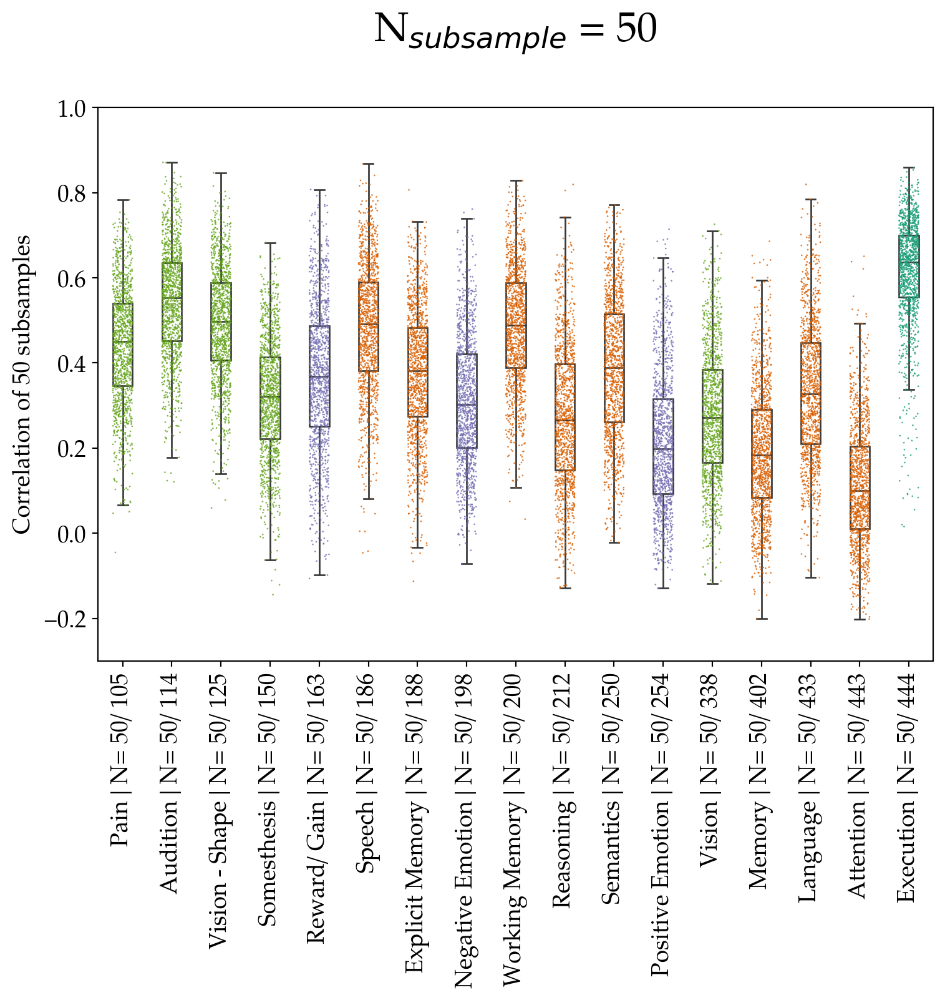

In [28]:
# Mapping each subdomain to the domain colors
subdomain_colors = {subdomain: domain_colors_dict[subdomain_domain_mapping[subdomain]] for subdomain in subdomain_domain_mapping}

# Plotting is as it was before

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Set backgrounds to transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

sns.stripplot(data=corrs_long, x='subdomain', y='corr', 
              order=subdomains_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False) # Here we use the new colormapping.

sns.boxplot(data=corrs_long, x='subdomain', y='corr',
            order=subdomains_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False) # Here we use the new colormapping.

ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 50', y=1.1, fontsize=25)


ax.set_xticks(range(len(subdomains_order)))
ax.set_xticklabels([f'{subdomains_labels[subdomain]} | N= 50/ {subdomains_exps[subdomain]}' for subdomain in subdomains_order], rotation=90, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [29]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Subdomains_SpatialCorrelations_N50.png'), bbox_inches='tight')

In [30]:
# Add the new data.
analysis = 'SALE'

for bd in BDs:
    for subdomain in subdomains:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, subdomain, 'subsamples_p-02')
        
        # Check if the directory exists before processing
        if os.path.exists(subsamples_dir):
            zmaps[analysis][subdomain] = []
            surf_zmaps[analysis][subdomain] = []
            
            for subsample in tqdm(range(50)):
                zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
                
                # Check if the file exists before loading and adding to lists
                if os.path.exists(zmap_path):
                    zmaps[analysis][subdomain].append(nibabel.load(zmap_path))
                    surf_zmaps[analysis][subdomain].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space set to match BrainMap data.
                else:
                    print(f"File not found: {zmap_path}")
            
            # Convert to np.array only if data is present
            if surf_zmaps[analysis][subdomain]:
                surf_zmaps[analysis][subdomain] = np.array(surf_zmaps[analysis][subdomain])
            else:
                print(f"No data found for {bd} - {subdomain}")
        else:
            print(f"Directory not found: {subsamples_dir}")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.64it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Attention/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Semantics/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Speech/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Explicit/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Working/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Reasoning/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Emotion.Negative/subsamples_p-02
Directory not found: /data/project/c

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.14it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Negative/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive.RewardGain/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Audition/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis.Pain/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision.Shape/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Action.Execution/subsamples_p-02
Directory not foun

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.72it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Audition/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis.Pain/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision.Shape/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Action.Execution/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Attention/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language.Semantics/subsamples_p-02
Dire

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.04it/s]


In [31]:
# Create full correlation matrix
corrs[analysis] = {}
corrs_tril[analysis] = {}
for subdomain in subdomains:
    surf_data = surf_zmaps[analysis][subdomain]
    
    # Check if there is sufficient data for correlation
    if len(surf_data) > 1:
        # Calculate correlation matrix
        corr_matrix = np.corrcoef(surf_data)
        
        # Flatten the lower triangular part of the correlation matrix
        corrs_tril[analysis][subdomain] = corr_matrix[np.tril_indices(corr_matrix.shape[0], -1)]
        
        # Store the full correlation matrix
        corrs[analysis][subdomain] = corr_matrix
    else:
        print(f"Insufficient data for correlation calculation for {subdomain}")

In [32]:
# Transform to long format
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['subdomain', 'pair', 'corr']

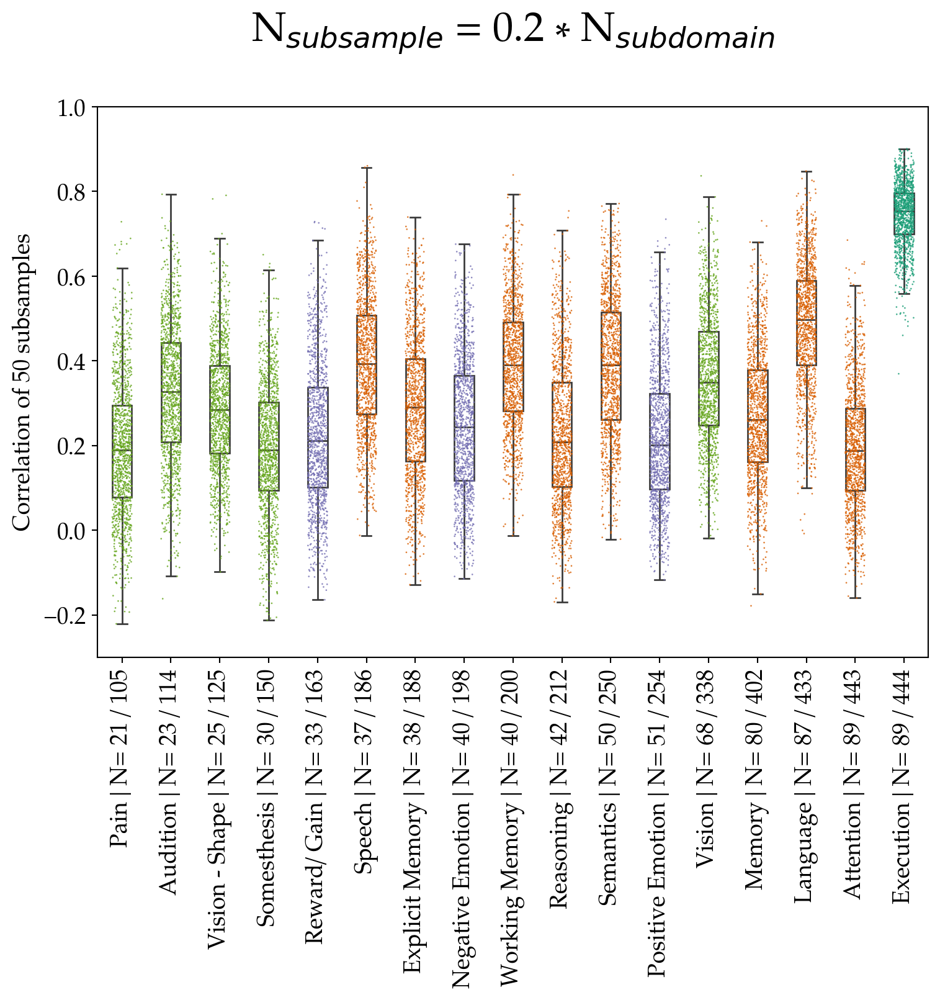

In [33]:
# Mapping each subdomain to the domain colors
subdomain_colors = {subdomain: domain_colors_dict[subdomain_domain_mapping[subdomain]] for subdomain in subdomain_domain_mapping}

# Plotting as it was before

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Set backgrounds to transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

sns.stripplot(data=corrs_long, x='subdomain', y='corr', 
              order=subdomains_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False)

sns.boxplot(data=corrs_long, x='subdomain', y='corr',
            order=subdomains_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False)

ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 0.2 * N$_{subdomain}$', y=1.1, fontsize=25)


ax.set_xticks(range(len(subdomains_order)))
ax.set_xticklabels([f'{subdomains_labels[subdomain]} | N= {subdomains_exps_sample[subdomain]} / {subdomains_exps[subdomain]}' for subdomain in subdomains_order], rotation=90, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [34]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Subdomains_SpatialCorrelations_p02.png'), bbox_inches='tight')

# For the sliding-N subsampling.
## This was done for all BDs/ subdomains with N > 100 (to be able to go up to NSubsample = 100).

In [28]:
# Import data for each BD - here we have to specifiy the path of the subdirectories containing the different subsample sizes (N).

# These are the subsample directory names
subsample_dirs = ['subsamples_n-25', 'subsamples', 'subsamples_n-75', 'subsamples_n-100'] # Note that we reuse the N = 50 subsampling from earlier, and hence it is simply called 'subsamples'.

analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each  BD
for bd in BDs_order:
    zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs}
    surf_zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs}

    # Loop through each subsample directory
    for subdir in subsample_dirs:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, subdir)
        
        # Loop through the 50 subsamples in the directory
        for subsample in tqdm(range(50)):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
            
            # Load the z-map and append to the respective lists
            zmaps[analysis][bd][subdir].append(nibabel.load(zmap_path))
            surf_zmaps[analysis][bd][subdir].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
        
        # Convert the surface z-maps list to a numpy array for consistency
        surf_zmaps[analysis][bd][subdir] = np.array(surf_zmaps[analysis][bd][subdir])

# This should produce 20 rows (20 folders looped through) which all have 50 maps.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.46it/s]


In [32]:
# Initialize dictionaries to store the correlations
corrs[analysis] = {}
corrs_tril[analysis] = {}

# Loop through each brain dataset (BD)
for bd in BDs_order:
    corrs[analysis][bd] = {}
    corrs_tril[analysis][bd] = {}

    # Loop through each subsample directory seperately (so we can make 4 correlation boxplots for each BD)
    for subdir in subsample_dirs:
        # Calculate correlations for the current subsample directory
        corrs[analysis][bd][subdir] = np.corrcoef(surf_zmaps[analysis][bd][subdir])
        
        # Discard the diagonal and upper triangle
        corrs_tril[analysis][bd][subdir] = corrs[analysis][bd][subdir][np.tril_indices(50, -1)]

In [33]:
# Transform to long format

# Initialize a list to collect the data for long format. This help in organizing it so that BDs and subsamples are in seperate columns.
long_data = []

# Loop through each BD
for bd in BDs_order:
    # Loop through each subsample directory
    for subdir in subsample_dirs:
        # Get correlations for the current BD/Subsample size combination
        corrs_values = corrs_tril[analysis][bd][subdir]
        
        # Loop over each individual correlation pair and assign the correct values into long_data.
        for idx, corr_value in enumerate(corrs_values):
            # Append a dictionary with the relevant data
            long_data.append({
                'domain': bd,
                'subsample_size': subdir,
                'pair': idx,
                'corr': corr_value
            })

# Convert the dictionary list into a pandas DataFrame
corrs_long = pd.DataFrame(long_data)

# Check if data wrangling went as expected
corrs_long.head()


,domain,subsample_size,pair,corr
0,Interoception,subsamples_n-25,0,0.074318
1,Interoception,subsamples_n-25,1,0.398373
2,Interoception,subsamples_n-25,2,0.057784
3,Interoception,subsamples_n-25,3,-0.088345
4,Interoception,subsamples_n-25,4,0.044268


/tmp/ipykernel_1253021/67694429.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].median().reset_index()


           domain subsample_label      corr
0   Interoception          N = 25  0.206456
1   Interoception          N = 50  0.441546
2   Interoception          N = 75  0.638778
3   Interoception         N = 100  0.828624
4         Emotion          N = 25  0.068620
5         Emotion          N = 50  0.125029
6         Emotion          N = 75  0.202415
7         Emotion         N = 100  0.246059
8          Action          N = 25  0.267244
9          Action          N = 50  0.471878
10         Action          N = 75  0.576548
11         Action         N = 100  0.639708
12     Perception          N = 25  0.040444
13     Perception          N = 50  0.102068
14     Perception          N = 75  0.125317
15     Perception         N = 100  0.163620
16      Cognition          N = 25  0.031831
17      Cognition          N = 50  0.061607
18      Cognition          N = 75  0.080167
19      Cognition         N = 100  0.104363


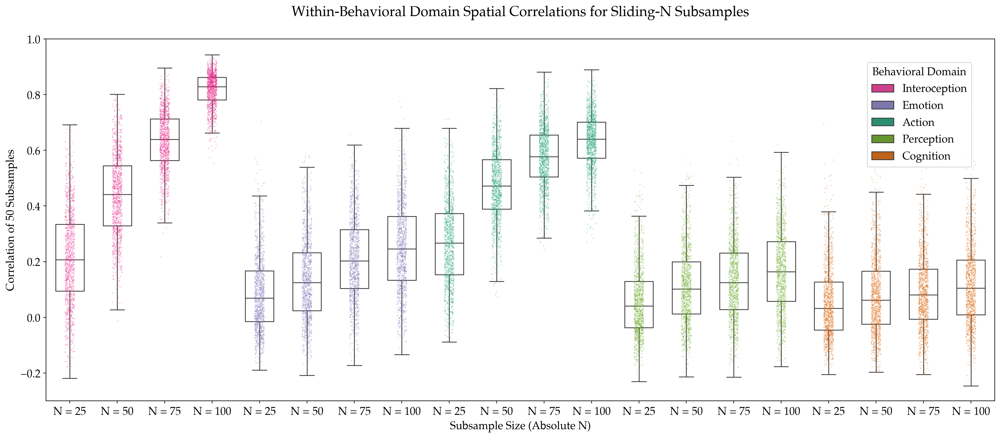

In [53]:


# Define custom labels for subsample sizes
subsample_labels = {
    'subsamples_n-25': 'N = 25',
    'subsamples': 'N = 50',
    'subsamples_n-75': 'N = 75',
    'subsamples_n-100': 'N = 100'
}

# Create a new figure and axes
fig, ax = plt.subplots(figsize=(18, 8))

# Make the background transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

# Use a color palette that is mapped to BDs_order
colors = sns.color_palette("Dark2", n_colors=len(BDs))  # Maintain color correspondence with other figures
palette = {bd: color for bd, color in zip(BDs, colors)}

# Map the 'subsample_size' column to the custom labels
corrs_long['subsample_label'] = corrs_long['subsample_size'].map(subsample_labels)

# Sort 'corrs_long' DataFrame according to the order in 'BDs_order' and the mapped 'subsample_label'
corrs_long['domain'] = pd.Categorical(corrs_long['domain'], categories=BDs_order, ordered=True)
corrs_long['subsample_label'] = pd.Categorical(corrs_long['subsample_label'], categories=subsample_labels.values(), ordered=True)
corrs_long = corrs_long.sort_values(by=['domain', 'subsample_label'])

# Create a new column in corrs_long to store custom labels
corrs_long['custom_label'] = corrs_long.apply(lambda row: f'{row["subsample_label"]} - {row["domain"]}', axis=1)

# Create boxplots using the custom labels (includes domain info for boxplots)
sns.boxplot(data=corrs_long, x='custom_label', y='corr', hue='domain',
            showfliers=False, showcaps=True, width=0.6,
            boxprops={"facecolor": (1, 1, 1, 0)},  # Transparent boxplots
            ax=ax, palette=palette)

# Overlay stripplots to show underlying data as best as possible
sns.stripplot(data=corrs_long, x='custom_label', y='corr', hue='domain',
              jitter=0.1, s=1.5, alpha=0.3, dodge=False, ax=ax, palette=palette, legend=False)

# Compute median values for each BD and subsample size
median_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].median().reset_index()

print(median_data)  # This can be used to connect median correlations per BD/Subsample combination. Also useful for reporting.

# Customize the axes
ax.set_xlabel('Subsample Size (Absolute N)', fontsize=14)
ax.set_ylabel('Correlation of 50 Subsamples', fontsize=14)
ax.set_title('Within-Behavioral Domain Spatial Correlations for Sliding-N Subsamples', y=1.05, fontsize=18)

# Modify the x-tick labels to only show the subsample size (N)
xtick_labels = [label.split(' - ')[0] for label in corrs_long['custom_label'].unique()]

# Add the x-tick labels
ax.set_xticks(range(len(xtick_labels)))
ax.set_xticklabels(xtick_labels, rotation=0, ha='center')

# Adjust the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(BDs_order)], labels[:len(BDs_order)], title='Behavioral Domain', loc='upper left', bbox_to_anchor=(0.86, .95))

# Set consistent Y-axis limits
ax.set_ylim([-0.3, 1])

# Display the plot
plt.tight_layout()
plt.show()


In [54]:
# Decide if you want to save the median correlations per BD and subsample proportion
median_data.to_csv(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Supplementary/Domains_Median-correlations_sliding-n.csv'), index=False)

In [55]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Supplementary/Domains_SpatialCorrelations_sliding-n.png'), bbox_inches='tight')

# Sliding-Proportion Subsampling Stability

In [16]:
# Import data for each BD - here we have to specifiy the path of the subdirectories containing the different subsample proportions.

# These are the subsample directory names
subsample_dirs_p = ['subsamples_p-02', 'subsamples_p-04', 'subsamples_p-06', 'subsamples_p-08'] # Note that we reuse the p  subsampling from earlier, and hence it is simply called 'subsamples'.

analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each  BD
for bd in BDs_order:
    zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs_p}
    surf_zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs_p}

    # Loop through each subsample directory
    for subdir in subsample_dirs_p:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, subdir)
        
        # Loop through the 50 subsamples in the directory
        for subsample in tqdm(range(50)):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
            
            # Load the z-map and append to the respective lists
            zmaps[analysis][bd][subdir].append(nibabel.load(zmap_path))
            surf_zmaps[analysis][bd][subdir].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
        
        # Convert the surface z-maps list to a numpy array for consistency
        surf_zmaps[analysis][bd][subdir] = np.array(surf_zmaps[analysis][bd][subdir])

# This should produce 20 rows (20 folders looped through) which all have 50 maps.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.22it/s]


In [20]:
# Initialize dictionaries to store the correlations
corrs_p = {}
corrs_tril_p = {}

corrs_p[analysis] = {}
corrs_tril_p[analysis] = {}

# Loop through each brain dataset (BD)
for bd in BDs_order:
    corrs_p[analysis][bd] = {}
    corrs_tril_p[analysis][bd] = {}

    # Loop through each subsample directory seperately (so we can make 4 correlation boxplots for each BD)
    for subdir in subsample_dirs_p:
        # Calculate correlations for the current subsample directory
        corrs_p[analysis][bd][subdir] = np.corrcoef(surf_zmaps[analysis][bd][subdir])
        
        # Discard the diagonal and upper triangle
        corrs_tril_p[analysis][bd][subdir] = corrs_p[analysis][bd][subdir][np.tril_indices(50, -1)]

In [21]:
# Transform to long format

# Initialize a list to collect the data for long format. This help in organizing it so that BDs and subsamples are in seperate columns.
long_data_p = []

# Loop through each BD
for bd in BDs_order:
    # Loop through each subsample directory
    for subdir in subsample_dirs_p:
        # Get correlations for the current BD/Subsample size combination
        corrs_values = corrs_tril_p[analysis][bd][subdir]
        
        # Loop over each individual correlation pair and assign the correct values into long_data.
        for idx, corr_value in enumerate(corrs_values):
            # Append a dictionary with the relevant data
            long_data_p.append({
                'domain': bd,
                'subsample_size': subdir,
                'pair': idx,
                'corr': corr_value
            })

# Convert the dictionary list into a pandas DataFrame
corrs_long_p = pd.DataFrame(long_data_p)

# Check if data wrangling went as expected
corrs_long_p.head()

,domain,subsample_size,pair,corr
0,Interoception,subsamples_p-02,0,0.074318
1,Interoception,subsamples_p-02,1,0.398373
2,Interoception,subsamples_p-02,2,0.057784
3,Interoception,subsamples_p-02,3,-0.088345
4,Interoception,subsamples_p-02,4,0.044268


/tmp/ipykernel_1253021/3425652282.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].median().reset_index()


           domain   subsample_size      corr
0   Interoception  subsamples_p-02  0.206456
1   Interoception  subsamples_p-04  0.441546
2   Interoception  subsamples_p-06  0.629852
3   Interoception  subsamples_p-08  0.821858
4         Emotion  subsamples_p-02  0.204484
5         Emotion  subsamples_p-04  0.424350
6         Emotion  subsamples_p-06  0.644330
7         Emotion  subsamples_p-08  0.830197
8          Action  subsamples_p-02  0.673132
9          Action  subsamples_p-04  0.846427
10         Action  subsamples_p-06  0.917215
11         Action  subsamples_p-08  0.967418
12     Perception  subsamples_p-02  0.206998
13     Perception  subsamples_p-04  0.409655
14     Perception  subsamples_p-06  0.614329
15     Perception  subsamples_p-08  0.804184
16      Cognition  subsamples_p-02  0.371529
17      Cognition  subsamples_p-04  0.622294
18      Cognition  subsamples_p-06  0.799675
19      Cognition  subsamples_p-08  0.912816


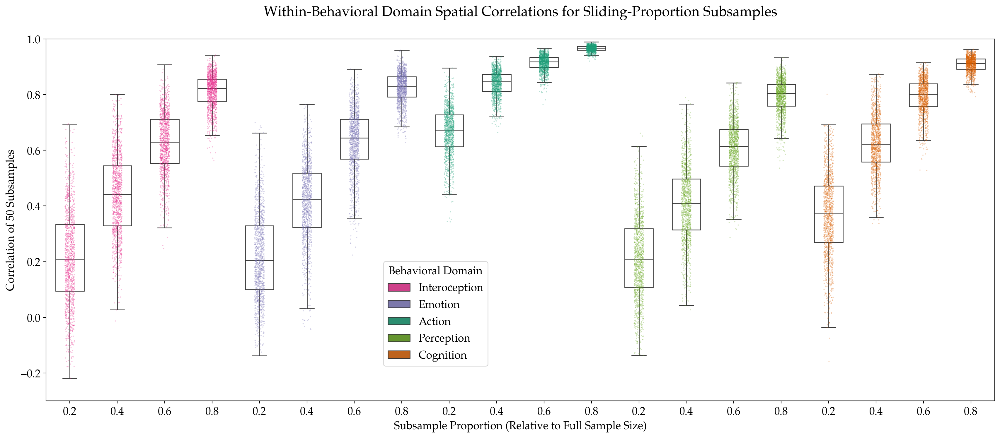

In [25]:
# Define custom labels for subsample sizes
subsample_labels_p = {
    'subsamples_p-02': '0.2',
    'subsamples_p-04': '0.4',
    'subsamples_p-06': '0.6',
    'subsamples_p-08': '0.8'
}

# Create a new figure and axes
fig, ax = plt.subplots(figsize=(18, 8))

# Make the background transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

# Use a color palette that is mapped to BDs_order
colors = sns.color_palette("Dark2", n_colors=len(BDs)) # Note that we use the non-ordered color assignment to make them correspond to other figures.
palette = {bd: color for bd, color in zip(BDs, colors)}

# Sort 'corrs_long_p' DataFrame according to the order in 'BDs_order' and 'subsample_size'
corrs_long_p['domain'] = pd.Categorical(corrs_long_p['domain'], categories=BDs_order, ordered=True)
corrs_long_p['subsample_size'] = pd.Categorical(corrs_long_p['subsample_size'], categories=sorted(subsample_labels_p.keys()), ordered=True)
corrs_long_p = corrs_long_p.sort_values(by=['domain', 'subsample_size'])

# Initialize list to store custom x-tick labels
xtick_labels = []

# Create x-tick labels, looping over BDs_order and subsample directories
for bd in BDs_order:
    for subdir in sorted(subsample_labels_p.keys()):
        # Append the custom label to the list
        xtick_labels.append(f'{subsample_labels_p[str(subdir)]}')

# Create new column in corrs_long_p to store custom labels
corrs_long_p['custom_label'] = corrs_long_p.apply(lambda row: f'{row["domain"]} (N = {row["subsample_size"]})', axis=1)

# Create boxplots using new x-tick labels
sns.boxplot(data=corrs_long_p, x='custom_label', y='corr', hue='domain',
            showfliers=False, showcaps=True, width=0.6,
            boxprops={"facecolor": (1, 1, 1, 0)},  # Transparent boxplots
            ax=ax, palette=palette)

# Overlay stripplots to show underlying data as best as possible
sns.stripplot(data=corrs_long_p, x='custom_label', y='corr', hue='domain',
              jitter=0.1, s=1.5, alpha=0.3, dodge=False, ax=ax, palette=palette, legend=False)

# Compute median values for each BD and subsample size
median_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].median().reset_index()

print(median_data_p)  # This can be used to connect median correlations per BD/Subsample combination. Also useful for reporting.

# Customize the axes
ax.set_xlabel('Subsample Proportion (Relative to Full Sample Size)', fontsize=14)
ax.set_ylabel('Correlation of 50 Subsamples', fontsize=14)
ax.set_title('Within-Behavioral Domain Spatial Correlations for Sliding-Proportion Subsamples', y=1.05, fontsize=18)

# Add the x-tick labels
ax.set_xticks(range(len(xtick_labels)))
ax.set_xticklabels(xtick_labels, rotation=0, ha='center')

# Adjust the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(BDs_order)], labels[:len(BDs_order)], title='Behavioral Domain', loc='upper left', bbox_to_anchor=(0.35, .4))

# Set consistent Y-axis limits
ax.set_ylim([-0.3, 1])

# Display the plot
plt.tight_layout()
plt.show()



In [26]:
# Decide if you want to save the median correlations per BD and subsample proportion
median_data_p.to_csv(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Supplementary/Domains_Median-correlations_sliding-p.csv'), index=False)

In [27]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_SpatialCorrelations_sliding-p.png'), bbox_inches='tight')

# Visualisation to show the percentage of subsamples that converge at every voxel per BD.

In [45]:
# Define a function to create the common SUITPy flatmap/ voxel heatmap.
def create_common_flatmap(surf_zmaps):
    # Total number of maps
    num_maps = len(surf_zmaps)
    
    # Print the shape of the first surf_map
    print("Shape of surf_zmaps[0]:", surf_zmaps[0].shape)
    
    # Initialize an empty array to store the count of subsamples per voxel
    count_subsamples = np.zeros_like(surf_zmaps[0])
    
    # Loop over each subsample map
    for surf_map in surf_zmaps:
        # Increment the count for each voxel where the value is greater than 0
        count_subsamples += (surf_map > 0)
    
    # Choose a random voxel and set its value to 100
    random_voxel = np.random.randint(0, count_subsamples.shape[0])
    count_subsamples[random_voxel] = 50 ## This is very hacky since it assigns a random voxel the maximum value of 50/50 subsamples. We can fix this by assigning this to a fixed location and correcting the color after!

        
    # Calculate the proportion of maps > 0 as a percentage
    percent_maps = (count_subsamples / num_maps) * 100
    
    # Plot the common flatmap
    flatmap.plot(percent_maps, colorbar=True, cmap='hot', bordersize=0.5, bordercolor='white', new_figure=False)

# First, the N = 50 subsamples.
## We focus on thresholded (p < 0.001 and K = 50) maps.

In [46]:
# Add data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_h-001_k-50_mask-D2009_MNI_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to mathc BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.26it/s]


Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


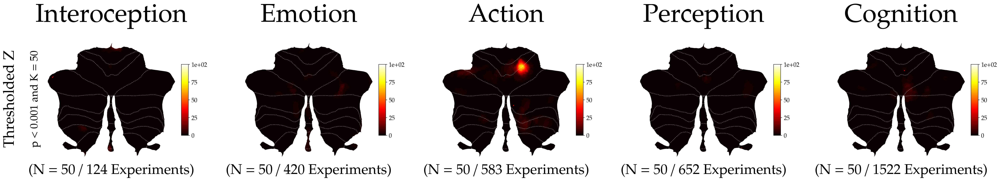

In [47]:
## Thresholded Z (p < 0.001 and K =50), N =  50 
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Overlay the cluster borders on top
    #ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
           # marker='.', linestyle=None, markersize=0.01, linewidth=0)
    
    # Overlay the cluster borders on top
   # ax.plot(cluster_borders_dict_strict[domain][:, 0], cluster_borders_dict_strict[domain][:, 1], color='red',
          #  marker='.', linestyle=None, markersize=0.01, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = 50 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)
    #ax.set_xlabel("X-axis Label")
    #ax.set_ylabel("Y-axis Label")

# Adjust layout
# plt.tight_layout()

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [48]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_N50.png'), bbox_inches='tight')

# N = 25 subsampling

In [55]:
# Add data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-25')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to mathc BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.72it/s]


Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


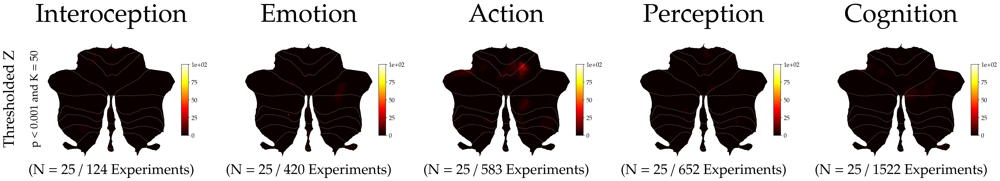

In [57]:
## Thresholded Z (p < 0.001 and K =50), N =  25
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Overlay the cluster borders on top
    #ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
           # marker='.', linestyle=None, markersize=0.01, linewidth=0)
    
    # Overlay the cluster borders on top
   # ax.plot(cluster_borders_dict_strict[domain][:, 0], cluster_borders_dict_strict[domain][:, 1], color='red',
          #  marker='.', linestyle=None, markersize=0.01, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = 25 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)
    #ax.set_xlabel("X-axis Label")
    #ax.set_ylabel("Y-axis Label")

# Adjust layout
# plt.tight_layout()

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [58]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_N25.png'), bbox_inches='tight')

In [59]:
# Add data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-75')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to mathc BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.58it/s]


Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


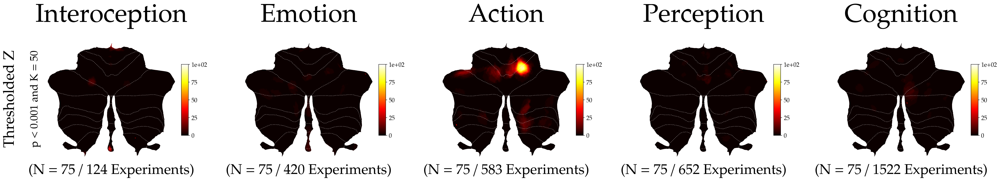

In [60]:
## Thresholded Z (p < 0.001 and K =50), N =  75
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Overlay the cluster borders on top
    #ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
           # marker='.', linestyle=None, markersize=0.01, linewidth=0)
    
    # Overlay the cluster borders on top
   # ax.plot(cluster_borders_dict_strict[domain][:, 0], cluster_borders_dict_strict[domain][:, 1], color='red',
          #  marker='.', linestyle=None, markersize=0.01, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = 75 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)
    #ax.set_xlabel("X-axis Label")
    #ax.set_ylabel("Y-axis Label")

# Adjust layout
# plt.tight_layout()

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [61]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_N75.png'), bbox_inches='tight')

# N = 100 subsampling

In [62]:
# Add data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-100')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to mathc BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.37it/s]


Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


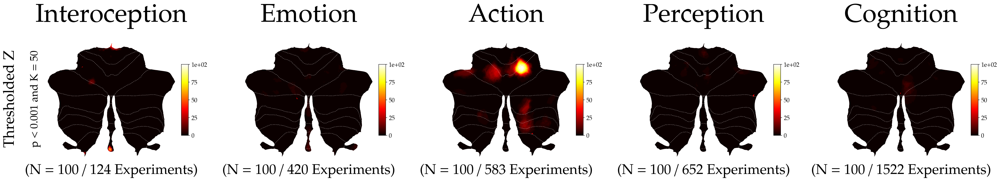

In [63]:
## Thresholded Z (p < 0.001 and K =50), N =  100
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Overlay the cluster borders on top
    #ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
           # marker='.', linestyle=None, markersize=0.01, linewidth=0)
    
    # Overlay the cluster borders on top
   # ax.plot(cluster_borders_dict_strict[domain][:, 0], cluster_borders_dict_strict[domain][:, 1], color='red',
          #  marker='.', linestyle=None, markersize=0.01, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = 100 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)
    #ax.set_xlabel("X-axis Label")
    #ax.set_ylabel("Y-axis Label")

# Adjust layout
# plt.tight_layout()

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [64]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_N75.png'), bbox_inches='tight')

# Proportion = 0.2 subsampling

In [49]:
# Load data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-02')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_h-001_k-50_mask-D2009_MNI_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.85it/s]


Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


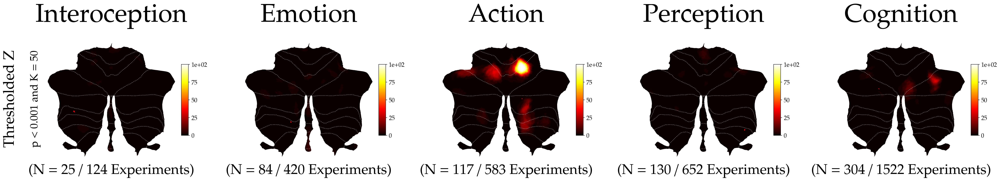

In [50]:
## Thresholded Z (p < 0.001 and K = 50), N =  0.2 * Ndomain

# Create a new figurte
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = {BDs_exps_sample[bd]} / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [51]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_02.png'), bbox_inches='tight')

# We can also visualize these heatmaps at different proportions. Starting with  p = 0.4.

In [66]:
# Load data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-04')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.10it/s]


In [70]:
BDs_exps_sample_04 = {
    'Action': 233,
    'Cognition': 609,
    'Emotion': 168,
    'Interoception': 50,
    'Perception': 261
}

Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


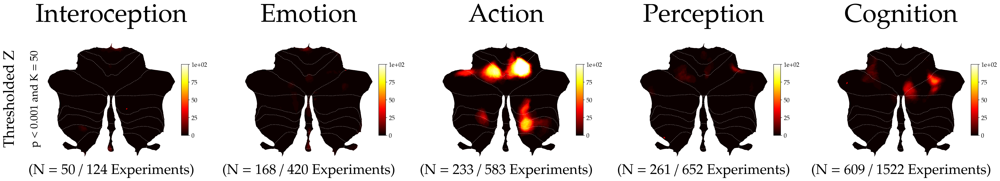

In [68]:
## Thresholded Z (p < 0.001 and K = 50), N =  0.4 * Ndomain

# Create a new figurte
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = {BDs_exps_sample_04[bd]} / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [71]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_04.png'), bbox_inches='tight')

# p = 0.6

In [69]:
# Load data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-06')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.63it/s]


In [72]:
BDs_exps_sample_06 = {
    'Action': 350,
    'Cognition': 913,
    'Emotion': 252,
    'Interoception': 74,
    'Perception': 391
}

Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


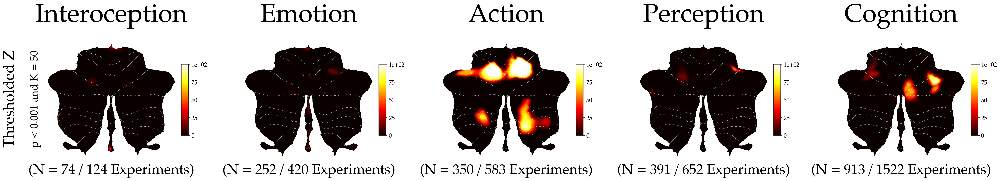

In [74]:
## Thresholded Z (p < 0.001 and K = 50), N =  0.6 * Ndomain

# Create a new figurte
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = {BDs_exps_sample_06[bd]} / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [77]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_06.png'), bbox_inches='tight')

# p = 0.8

In [76]:
# Load data.
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-08')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.20it/s]


In [75]:
BDs_exps_sample_08 = {
    'Action': 466,
    'Cognition': 1218,
    'Emotion': 336,
    'Interoception': 99,
    'Perception': 522
}

Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)
Shape of surf_zmaps[0]: (28935,)


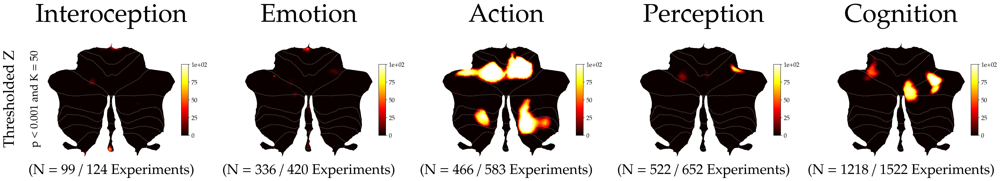

In [78]:
## Thresholded Z (p < 0.001 and K = 50), N =  0.8 * Ndomain

# Create a new figurte
fig = plt.figure(figsize=(40, 6))


# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1,5, i + 1)
    
    create_common_flatmap(surf_zmaps[analysis][bd])
    
    # Set titles and labels as needed
    ax.set_title(f"{bd}", fontsize = 60)
    ax.text(0.5, 0.0, f'(N = {BDs_exps_sample_08[bd]} / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes)

# Add a y-axis label to the main plot
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text (0.12, 0.5, 'p < 0.001 and K = 50', va='center', ha='center', rotation='vertical', fontsize = 25)
          
# Show the plot
plt.show()

In [79]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Stability_analyses/Figure3/Domains_voxel-heatmap_thres_08.png'), bbox_inches='tight')

# The End.